In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer

In [2]:
df=pd.read_csv('USA_Housing.csv')
df

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386
...,...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,USNS Williams\nFPO AP 30153-7653
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,"PSC 9258, Box 8489\nAPO AA 42991-3352"
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,"4215 Tracy Garden Suite 076\nJoshualand, VA 01..."
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,USS Wallace\nFPO AE 73316


In [3]:
df.describe()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,68583.108984,5.977222,6.987792,3.981330,36163.516039,1.232073e+06
std,10657.991214,0.991456,1.005833,1.234137,9925.650114,3.531176e+05
min,17796.631190,2.644304,3.236194,2.000000,172.610686,1.593866e+04
25%,61480.562388,5.322283,6.299250,3.140000,29403.928702,9.975771e+05
50%,68804.286404,5.970429,7.002902,4.050000,36199.406689,1.232669e+06
75%,75783.338666,6.650808,7.665871,4.490000,42861.290769,1.471210e+06
max,107701.748378,9.519088,10.759588,6.500000,69621.713378,2.469066e+06


In [4]:
# 1. Standard Scaling
scaler = StandardScaler()
df[['Scaled Population', 'Scaled Price']] = scaler.fit_transform(df[['Area Population', 'Price']])

In [5]:
# 2. Min-Max Scaling
minmax_scaler = MinMaxScaler()
df[['MinMax Population', 'MinMax Price']] = minmax_scaler.fit_transform(df[['Area Population', 'Price']])

In [6]:
# 3. Log Transformation
df['Log Population'] = np.log(df['Area Population'] + 1)  # Adding 1 to avoid log(0)
df['Log Price'] = np.log(df['Price'] + 1)

In [7]:
# 4. Outlier Clipping
df['Clipped Population'] = df['Area Population'].clip(
    lower=df['Area Population'].quantile(0.05),
    upper=df['Area Population'].quantile(0.95)
)
df['Clipped Price'] = df['Price'].clip(
    lower=df['Price'].quantile(0.05),
    upper=df['Price'].quantile(0.95)
)

In [8]:
# 5. Power Transformation (Yeo-Johnson)
pt = PowerTransformer(method='yeo-johnson')
df[['Power Population', 'Power Price']] = pt.fit_transform(df[['Area Population', 'Price']])


In [9]:
# View the transformed data
print(df.head())

   Avg. Area Income  Avg. Area House Age  Avg. Area Number of Rooms  \
0      79545.458574             5.682861                   7.009188   
1      79248.642455             6.002900                   6.730821   
2      61287.067179             5.865890                   8.512727   
3      63345.240046             7.188236                   5.586729   
4      59982.197226             5.040555                   7.839388   

   Avg. Area Number of Bedrooms  Area Population         Price  \
0                          4.09     23086.800503  1.059034e+06   
1                          3.09     40173.072174  1.505891e+06   
2                          5.13     36882.159400  1.058988e+06   
3                          3.26     34310.242831  1.260617e+06   
4                          4.23     26354.109472  6.309435e+05   

                                             Address  Scaled Population  \
0  208 Michael Ferry Apt. 674\nLaurabury, NE 3701...          -1.317599   
1  188 Johnson Views Suite

In [10]:
df.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address,Scaled Population,Scaled Price,MinMax Population,MinMax Price,Log Population,Log Price,Clipped Population,Clipped Price,Power Population,Power Price
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701...",-1.317599,-0.490081,0.329942,0.425210,10.047060,13.872868,23086.800503,1.059034e+06,-1.322298,-0.488927
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA...",0.403999,0.775508,0.575968,0.607369,10.600977,14.224896,40173.072174,1.505891e+06,0.410150,0.775783
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482...",0.072410,-0.490211,0.528582,0.425192,10.515510,13.872825,36882.159400,1.058988e+06,0.080534,-0.489056
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820,-0.186734,0.080843,0.491549,0.507384,10.443228,14.047112,34310.242831,1.260617e+06,-0.178258,0.082062
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386,-0.988387,-1.702518,0.376988,0.250702,10.179417,13.354973,26354.109472,6.517455e+05,-0.986459,-1.704819


In [11]:
df.loc[5]

Avg. Area Income                                                     80175.754159
Avg. Area House Age                                                      4.988408
Avg. Area Number of Rooms                                                6.104512
Avg. Area Number of Bedrooms                                                 4.04
Area Population                                                      26748.428425
Price                                                              1068138.074394
Address                         06039 Jennifer Islands Apt. 443\nTracyport, KS...
Scaled Population                                                       -0.948656
Scaled Price                                                            -0.464296
MinMax Population                                                        0.382666
MinMax Price                                                             0.428922
Log Population                                                          10.194268
Log Price       

In [12]:
df['Avg. Area House Age']

0       5.682861
1       6.002900
2       5.865890
3       7.188236
4       5.040555
          ...   
4995    7.830362
4996    6.999135
4997    7.250591
4998    5.534388
4999    5.992305
Name: Avg. Area House Age, Length: 5000, dtype: float64

In [13]:
df.tail()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address,Scaled Population,Scaled Price,MinMax Population,MinMax Price,Log Population,Log Price,Clipped Population,Clipped Price,Power Population,Power Price
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,USNS Williams\nFPO AP 30153-7653,-1.342732,-0.486795,0.326351,0.425683,10.036197,13.873963,22837.361035,1.060194e+06,-1.348047,-0.485638
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,"PSC 9258, Box 8489\nAPO AA 42991-3352",-1.062747,0.709594,0.366362,0.597881,10.151016,14.209320,25616.115489,1.482618e+06,-1.062092,0.710002
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,"4215 Tracy Garden Suite 076\nJoshualand, VA 01...",-0.291937,-0.570244,0.476515,0.413672,10.412326,13.845778,33266.145490,1.030730e+06,-0.283636,-0.569167
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,USS Wallace\nFPO AE 73316,0.651116,-0.094640,0.611282,0.482127,10.660234,13.996713,42625.620156,1.198657e+06,0.654766,-0.093353
4999,65510.581804,5.992305,6.792336,4.07,46501.283803,1.298950e+06,"37778 George Ridges Apt. 509\nEast Holly, NV 2...",1.041625,0.189411,0.667088,0.523011,10.747257,14.077068,46501.283803,1.298950e+06,1.039670,0.190553


In [14]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Avg. Area Income              5000 non-null   float64
 1   Avg. Area House Age           5000 non-null   float64
 2   Avg. Area Number of Rooms     5000 non-null   float64
 3   Avg. Area Number of Bedrooms  5000 non-null   float64
 4   Area Population               5000 non-null   float64
 5   Price                         5000 non-null   float64
 6   Address                       5000 non-null   object 
 7   Scaled Population             5000 non-null   float64
 8   Scaled Price                  5000 non-null   float64
 9   MinMax Population             5000 non-null   float64
 10  MinMax Price                  5000 non-null   float64
 11  Log Population                5000 non-null   float64
 12  Log Price                     5000 non-null   float64
 13  Cli

In [15]:
df.describe()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Scaled Population,Scaled Price,MinMax Population,MinMax Price,Log Population,Log Price,Clipped Population,Clipped Price,Power Population,Power Price
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5.000000e+03,5.000000e+03
mean,68583.108984,5.977222,6.987792,3.981330,36163.516039,1.232073e+06,-3.041123e-16,-1.392664e-16,0.518234,0.495748,10.452301,13.975406,36133.217532,1.232186e+06,-6.167511e-16,-3.694822e-17
std,10657.991214,0.991456,1.005833,1.234137,9925.650114,3.531176e+05,1.000100e+00,1.000100e+00,0.142920,0.143946,0.316012,0.336578,9048.772860,3.228340e+05,1.000100e+00,1.000100e+00
min,17796.631190,2.644304,3.236194,2.000000,172.610686,1.593866e+04,-3.626413e+00,-3.444336e+00,0.000000,0.000000,5.156815,9.676565,19902.850077,6.517455e+05,-3.827034e+00,-3.469068e+00
25%,61480.562388,5.322283,6.299250,3.140000,29403.928702,9.975771e+05,-6.810902e-01,-6.641384e-01,0.420903,0.400158,10.288918,13.813086,29403.928702,9.975771e+05,-6.751706e-01,-6.631771e-01
50%,68804.286404,5.970429,7.002902,4.050000,36199.406689,1.232669e+06,3.616311e-03,1.690042e-03,0.518751,0.495992,10.496826,14.024693,36199.406689,1.232669e+06,1.193956e-02,2.949403e-03
75%,75783.338666,6.650808,7.665871,4.490000,42861.290769,1.471210e+06,6.748621e-01,6.772856e-01,0.614676,0.593231,10.665748,14.201597,42861.290769,1.471210e+06,6.782277e-01,6.777554e-01
max,107701.748378,9.519088,10.759588,6.500000,69621.713378,2.469066e+06,3.371219e+00,3.503412e+00,1.000000,1.000000,11.150846,14.719351,52660.094183,1.813570e+06,3.301569e+00,3.491923e+00


In [16]:
df.columns

Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population', 'Price', 'Address',
       'Scaled Population', 'Scaled Price', 'MinMax Population',
       'MinMax Price', 'Log Population', 'Log Price', 'Clipped Population',
       'Clipped Price', 'Power Population', 'Power Price'],
      dtype='object')

C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\User\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue

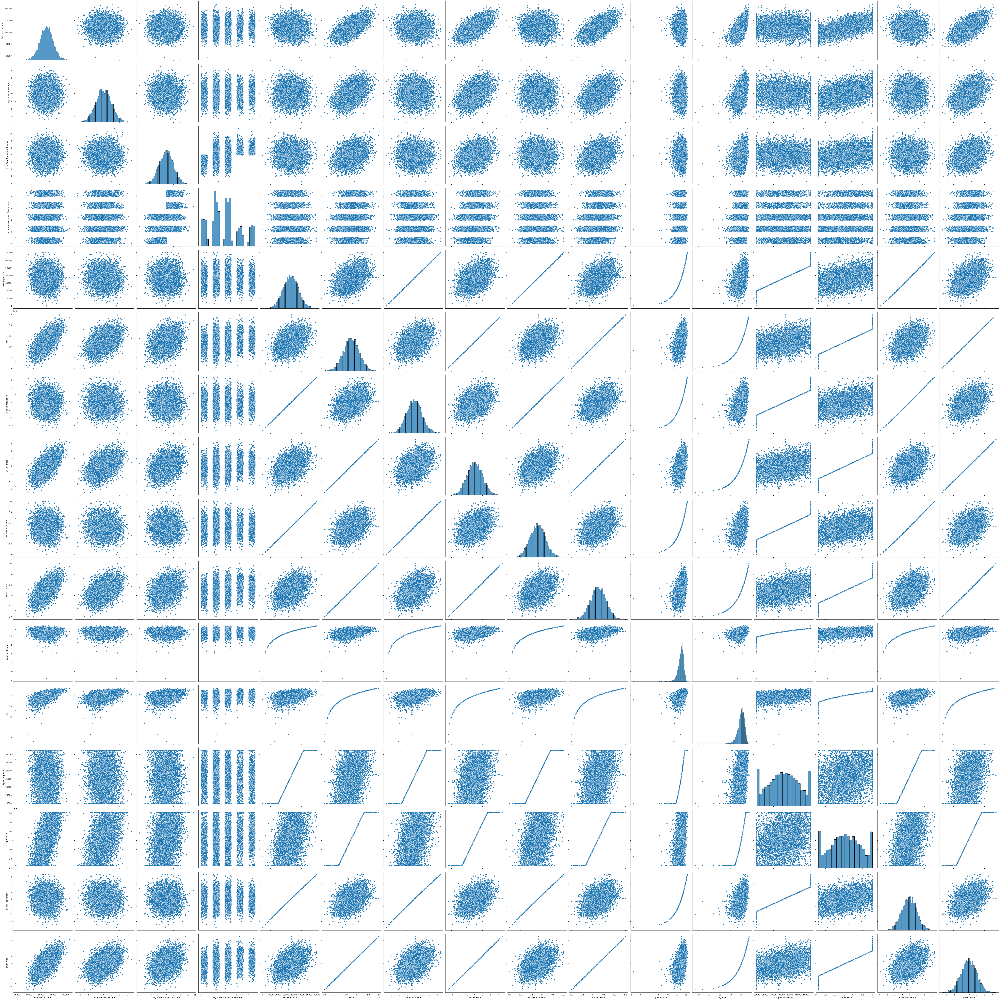

In [17]:
sns.pairplot(df,  palette='husl', height=4.5)

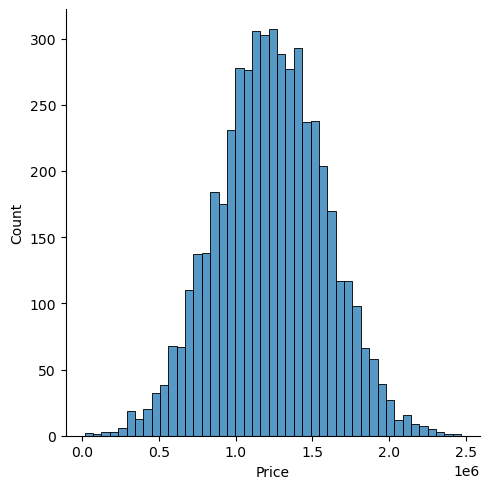

In [18]:
sns.displot(df['Price'])

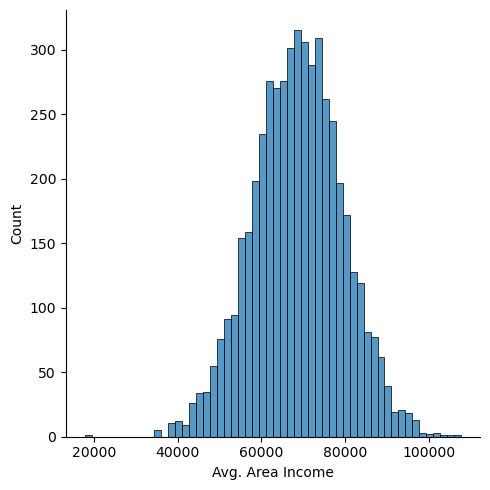

In [19]:
sns.displot(df['Avg. Area Income'])

In [20]:
df1=df.drop('Address',axis=1)##

In [21]:
df1

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Scaled Population,Scaled Price,MinMax Population,MinMax Price,Log Population,Log Price,Clipped Population,Clipped Price,Power Population,Power Price
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,-1.317599,-0.490081,0.329942,0.425210,10.047060,13.872868,23086.800503,1.059034e+06,-1.322298,-0.488927
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,0.403999,0.775508,0.575968,0.607369,10.600977,14.224896,40173.072174,1.505891e+06,0.410150,0.775783
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,0.072410,-0.490211,0.528582,0.425192,10.515510,13.872825,36882.159400,1.058988e+06,0.080534,-0.489056
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,-0.186734,0.080843,0.491549,0.507384,10.443228,14.047112,34310.242831,1.260617e+06,-0.178258,0.082062
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,-0.988387,-1.702518,0.376988,0.250702,10.179417,13.354973,26354.109472,6.517455e+05,-0.986459,-1.704819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,-1.342732,-0.486795,0.326351,0.425683,10.036197,13.873963,22837.361035,1.060194e+06,-1.348047,-0.485638
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,-1.062747,0.709594,0.366362,0.597881,10.151016,14.209320,25616.115489,1.482618e+06,-1.062092,0.710002
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,-0.291937,-0.570244,0.476515,0.413672,10.412326,13.845778,33266.145490,1.030730e+06,-0.283636,-0.569167
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,0.651116,-0.094640,0.611282,0.482127,10.660234,13.996713,42625.620156,1.198657e+06,0.654766,-0.093353


In [22]:
df1.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Scaled Population,Scaled Price,MinMax Population,MinMax Price,Log Population,Log Price,Clipped Population,Clipped Price,Power Population,Power Price
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,-1.317599,-0.490081,0.329942,0.425210,10.047060,13.872868,23086.800503,1.059034e+06,-1.322298,-0.488927
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,0.403999,0.775508,0.575968,0.607369,10.600977,14.224896,40173.072174,1.505891e+06,0.410150,0.775783
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,0.072410,-0.490211,0.528582,0.425192,10.515510,13.872825,36882.159400,1.058988e+06,0.080534,-0.489056
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,-0.186734,0.080843,0.491549,0.507384,10.443228,14.047112,34310.242831,1.260617e+06,-0.178258,0.082062
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,-0.988387,-1.702518,0.376988,0.250702,10.179417,13.354973,26354.109472,6.517455e+05,-0.986459,-1.704819


<Axes: >

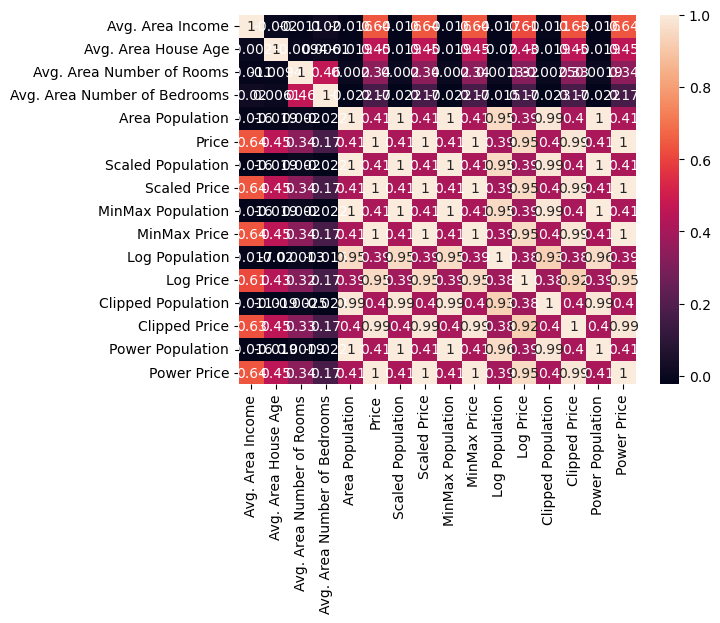

In [23]:
sns.heatmap(df1.corr(),annot=True)##to see corelation which columns give better value to other columns

Create model

In [25]:
df1



,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Scaled Population,Scaled Price,MinMax Population,MinMax Price,Log Population,Log Price,Clipped Population,Clipped Price,Power Population,Power Price
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,-1.317599,-0.490081,0.329942,0.425210,10.047060,13.872868,23086.800503,1.059034e+06,-1.322298,-0.488927
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,0.403999,0.775508,0.575968,0.607369,10.600977,14.224896,40173.072174,1.505891e+06,0.410150,0.775783
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,0.072410,-0.490211,0.528582,0.425192,10.515510,13.872825,36882.159400,1.058988e+06,0.080534,-0.489056
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,-0.186734,0.080843,0.491549,0.507384,10.443228,14.047112,34310.242831,1.260617e+06,-0.178258,0.082062
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,-0.988387,-1.702518,0.376988,0.250702,10.179417,13.354973,26354.109472,6.517455e+05,-0.986459,-1.704819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,-1.342732,-0.486795,0.326351,0.425683,10.036197,13.873963,22837.361035,1.060194e+06,-1.348047,-0.485638
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,-1.062747,0.709594,0.366362,0.597881,10.151016,14.209320,25616.115489,1.482618e+06,-1.062092,0.710002
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,-0.291937,-0.570244,0.476515,0.413672,10.412326,13.845778,33266.145490,1.030730e+06,-0.283636,-0.569167
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,0.651116,-0.094640,0.611282,0.482127,10.660234,13.996713,42625.620156,1.198657e+06,0.654766,-0.093353


In [26]:
df.columns


Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population', 'Price', 'Address',
       'Scaled Population', 'Scaled Price', 'MinMax Population',
       'MinMax Price', 'Log Population', 'Log Price', 'Clipped Population',
       'Clipped Price', 'Power Population', 'Power Price'],
      dtype='object')

In [27]:
x=df1[['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population']]

In [28]:
y=df1['Price']

In [29]:
from sklearn.model_selection import train_test_split


In [30]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.4, random_state=42)

In [31]:
from sklearn.linear_model import LinearRegression
lm=LinearRegression()

In [32]:
lm.fit(X_train,y_train)

LinearRegression()

In [33]:
prediction=lm.predict(X_test)

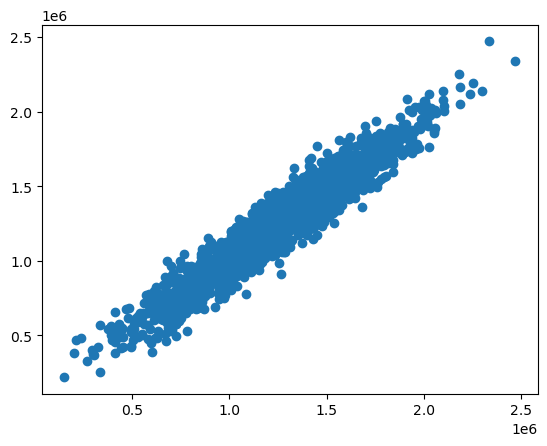

In [34]:
plt.scatter(y_test,prediction)

In [35]:
prediction

array([1311074.59195062, 1239575.7569346 , 1243916.25450742, ...,
        840825.86587512, 1050491.02276031,  946720.46738516])

In [36]:
import numpy as np

In [37]:
newdata=np.array([[78491.275435,6.999135,6.576763,4.02,25616.115489	]])

In [38]:
value=lm.predict(newdata)

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [39]:
value


array([1405516.02934626])